In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.preprocessing import OrdinalEncoder

import warnings
warnings.filterwarnings('ignore')


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


1.After importing the data, examine variables such as Dt_Customer and Income to verify their accurate importation.

In [6]:
df = pd.read_csv('marketing_data.csv')
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,1826,1970,Graduation,Divorced,"$84,835.00",0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP
1,1,1961,Graduation,Single,"$57,091.00",0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA
2,10476,1958,Graduation,Married,"$67,267.00",0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US
3,1386,1967,Graduation,Together,"$32,474.00",1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS
4,5371,1989,Graduation,Single,"$21,474.00",1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   2240 non-null   int64 
 1   Year_Birth           2240 non-null   int64 
 2   Education            2240 non-null   object
 3   Marital_Status       2240 non-null   object
 4    Income              2216 non-null   object
 5   Kidhome              2240 non-null   int64 
 6   Teenhome             2240 non-null   int64 
 7   Dt_Customer          2240 non-null   object
 8   Recency              2240 non-null   int64 
 9   MntWines             2240 non-null   int64 
 10  MntFruits            2240 non-null   int64 
 11  MntMeatProducts      2240 non-null   int64 
 12  MntFishProducts      2240 non-null   int64 
 13  MntSweetProducts     2240 non-null   int64 
 14  MntGoldProds         2240 non-null   int64 
 15  NumDealsPurchases    2240 non-null   int64 
 16  NumWeb

In [8]:
# Renaming Income Column

df.columns = ['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income',
       'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain', 'Country']

In [9]:
# Removing Dollar Sign From Income

df['Income'] = df['Income'].str.replace(',', '')
df['Income'] = df['Income'].str.replace('$', '')


In [10]:
df['Income'] = df['Income'].astype(float)

In [11]:
# Dt_Customer Is An Object, Converting It Into A Date

df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format ='%m/%d/%y')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

2.There are missing income values for some customers. Conduct missing value imputation, considering that customers with similar education and marital status tend to have comparable yearly incomes, on average. It may be necessary to cleanse the data before proceeding. Specifically, scrutinize the categories of education and marital status for data cleaning.

In [13]:
# Scrutinizing and Cleaning Marital Status

df['Marital_Status'] = df['Marital_Status'].replace({
    'YOLO': 'Unknown',
    'Absurd': 'Unknown',
    'Alone': 'Single'
})
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP
1,1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA
2,10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US
3,1386,1967,Graduation,Together,32474.0,1,1,2014-05-11,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS
4,5371,1989,Graduation,Single,21474.0,1,0,2014-04-08,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP
5,7348,1958,PhD,Single,71691.0,0,0,2014-03-17,0,336,130,411,240,32,43,1,4,7,5,2,0,0,0,0,0,1,0,SP
6,4073,1954,2n Cycle,Married,63564.0,0,0,2014-01-29,0,769,80,252,15,34,65,1,10,10,7,6,1,0,0,0,0,1,0,GER
7,1991,1967,Graduation,Together,44931.0,0,1,2014-01-18,0,78,0,11,0,0,7,1,2,1,3,5,0,0,0,0,0,0,0,SP
8,4047,1954,PhD,Married,65324.0,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,US
9,9477,1954,PhD,Married,65324.0,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,IND


In [14]:
# Scrutinizing and Cleaning Education

df['Education'] = df['Education'].replace({
    '2n Cycle': '2nd Cycle',
    'Master': "Master's"
})
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP
1,1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA
2,10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US
3,1386,1967,Graduation,Together,32474.0,1,1,2014-05-11,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS
4,5371,1989,Graduation,Single,21474.0,1,0,2014-04-08,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP
5,7348,1958,PhD,Single,71691.0,0,0,2014-03-17,0,336,130,411,240,32,43,1,4,7,5,2,0,0,0,0,0,1,0,SP
6,4073,1954,2nd Cycle,Married,63564.0,0,0,2014-01-29,0,769,80,252,15,34,65,1,10,10,7,6,1,0,0,0,0,1,0,GER
7,1991,1967,Graduation,Together,44931.0,0,1,2014-01-18,0,78,0,11,0,0,7,1,2,1,3,5,0,0,0,0,0,0,0,SP
8,4047,1954,PhD,Married,65324.0,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,US
9,9477,1954,PhD,Married,65324.0,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,IND


In [15]:
# Create Grouped Average Income Of Education & Marital Status

df['Group_Avg_Income'] = df.groupby(['Education', 'Marital_Status'])['Income'].transform('mean')

# Impute Income Where Value Is Nan

df['Income'] = df['Income'].fillna(df['Group_Avg_Income'])

# Drop Grouped Average Column If Not Needed

df.drop(columns='Group_Avg_Income', inplace=True)

df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,1826,1970,Graduation,Divorced,84835.000000,0,0,2014-06-16,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP
1,1,1961,Graduation,Single,57091.000000,0,0,2014-06-15,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA
2,10476,1958,Graduation,Married,67267.000000,0,1,2014-05-13,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US
3,1386,1967,Graduation,Together,32474.000000,1,1,2014-05-11,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS
4,5371,1989,Graduation,Single,21474.000000,1,0,2014-04-08,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP
5,7348,1958,PhD,Single,71691.000000,0,0,2014-03-17,0,336,130,411,240,32,43,1,4,7,5,2,0,0,0,0,0,1,0,SP
6,4073,1954,2nd Cycle,Married,63564.000000,0,0,2014-01-29,0,769,80,252,15,34,65,1,10,10,7,6,1,0,0,0,0,1,0,GER
7,1991,1967,Graduation,Together,44931.000000,0,1,2014-01-18,0,78,0,11,0,0,7,1,2,1,3,5,0,0,0,0,0,0,0,SP
8,4047,1954,PhD,Married,65324.000000,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,US
9,9477,1954,PhD,Married,65324.000000,0,1,2014-01-11,0,384,0,102,21,32,5,3,6,2,9,4,0,0,0,0,0,0,0,IND


3.Create variables to represent the total number of children, age, and total spending.

a.Derive the total purchases from the number of transactions across the three channels.

In [16]:
# Finding Number Of Children

df['Total_Children'] = df['Kidhome'] + df['Teenhome']


# Finding Age Using Birth Year

df['Age'] = 2025 - df['Year_Birth']


# Finding Total Spending

spending_columns = [
    'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'
]
df['Total_Spending'] = df[spending_columns].sum(axis=1)


# Finding Total Purchase From Three Channels

purchase_columns = [
    'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases'
]
df['Total_Purchases'] = df[purchase_columns].sum(axis=1)

df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country,Total_Children,Age,Total_Spending,Total_Purchases
0,1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP,0,55,1190,14
1,1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA,0,64,577,17
2,10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US,1,67,251,10
3,1386,1967,Graduation,Together,32474.0,1,1,2014-05-11,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS,2,58,11,3
4,5371,1989,Graduation,Single,21474.0,1,0,2014-04-08,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP,1,36,91,6


4.Generate box plots and histograms to gain insights into the distributions and identify outliers. Implement outlier treatment as needed.

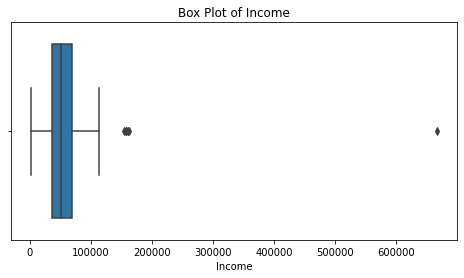

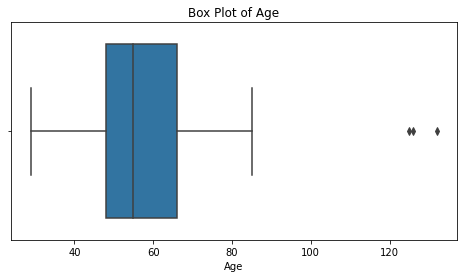

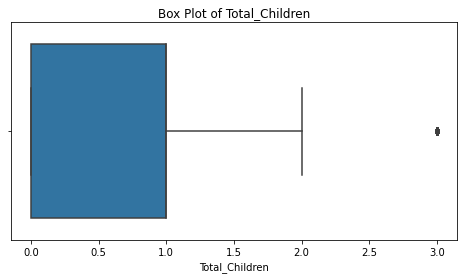

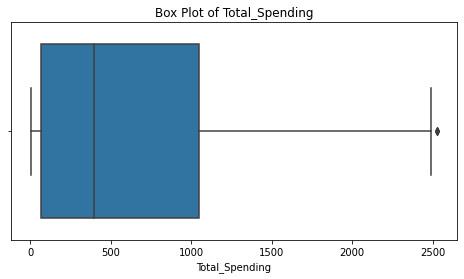

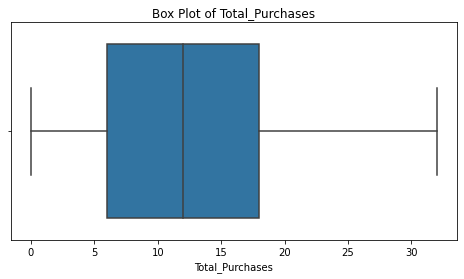

In [17]:
# Variables Used For Plotting

plot_vars = ['Income', 'Age', 'Total_Children', 'Total_Spending', 'Total_Purchases']

# Box plots

for var in plot_vars:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[var])
    plt.title(f'Box Plot of {var}')
    plt.show()


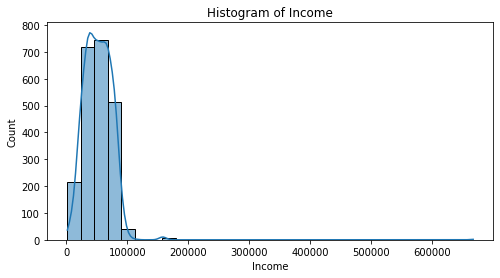

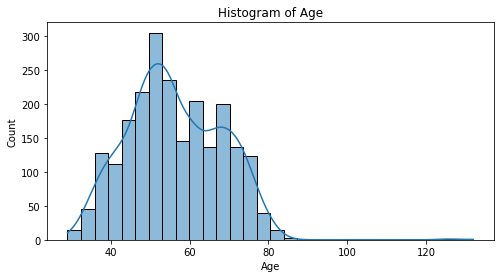

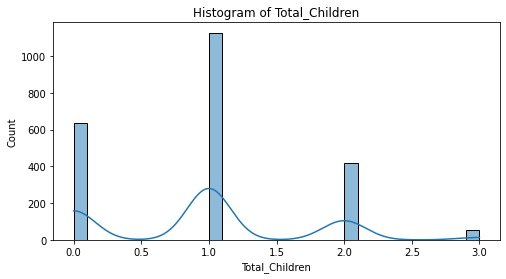

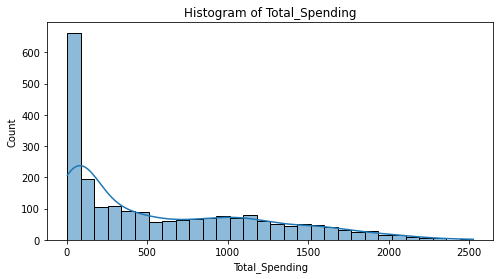

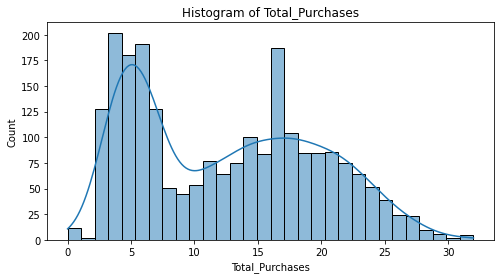

In [18]:
# Histograms Forn Same Variables

for var in plot_vars:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[var], kde=True, bins=30)
    plt.title(f'Histogram of {var}')
    plt.show()


In [19]:
# Function For Capping Outliers

def cap_outliers(col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df[col] = df[col].clip(lower, upper)

# Apply It To The Columns Having Skewed Distribution

for col in ['Income', 'Total_Spending', 'Total_Purchases']:
    cap_outliers(col)


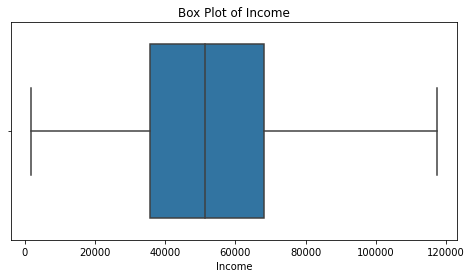

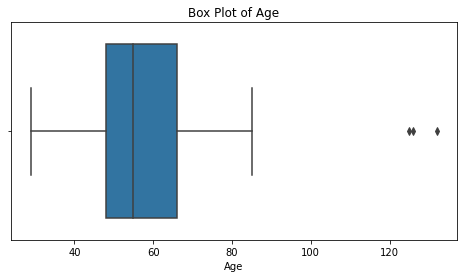

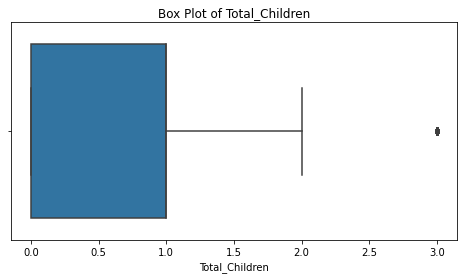

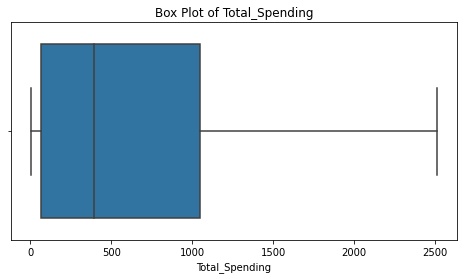

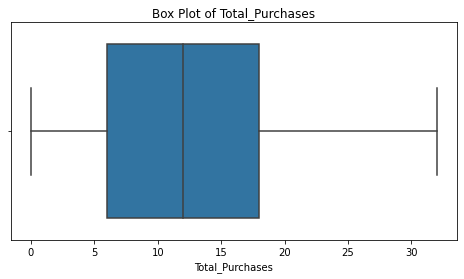

In [20]:
# Box Plots After Ouitlier Treatment

for var in plot_vars:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[var])
    plt.title(f'Box Plot of {var}')
    plt.show()
    

5.Apply ordinal and one-hot encoding based on the various types of categorical variables.

In [21]:
# Ordinal Encoding for Education

education_order = ['Basic', '2nd Cycle', 'Graduation', "Master's", 'PhD']

ordinal_encoder = OrdinalEncoder(categories=[education_order])
df['Education'] = ordinal_encoder.fit_transform(df[['Education']])


# One-Hot Encoding Form Marital Status and Country

df = pd.get_dummies(df, columns=['Marital_Status', 'Country'], drop_first=True)


In [22]:
# Final Check For Ordinal And One-Hot Encoding

print(df.info())  # Check the structure
print(df.head())  # Preview first few rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 42 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ID                       2240 non-null   int64         
 1   Year_Birth               2240 non-null   int64         
 2   Education                2240 non-null   float64       
 3   Income                   2240 non-null   float64       
 4   Kidhome                  2240 non-null   int64         
 5   Teenhome                 2240 non-null   int64         
 6   Dt_Customer              2240 non-null   datetime64[ns]
 7   Recency                  2240 non-null   int64         
 8   MntWines                 2240 non-null   int64         
 9   MntFruits                2240 non-null   int64         
 10  MntMeatProducts          2240 non-null   int64         
 11  MntFishProducts          2240 non-null   int64         
 12  MntSweetProducts         2240 non-

6.Generate a heatmap to illustrate the correlation between different pairs of variables.

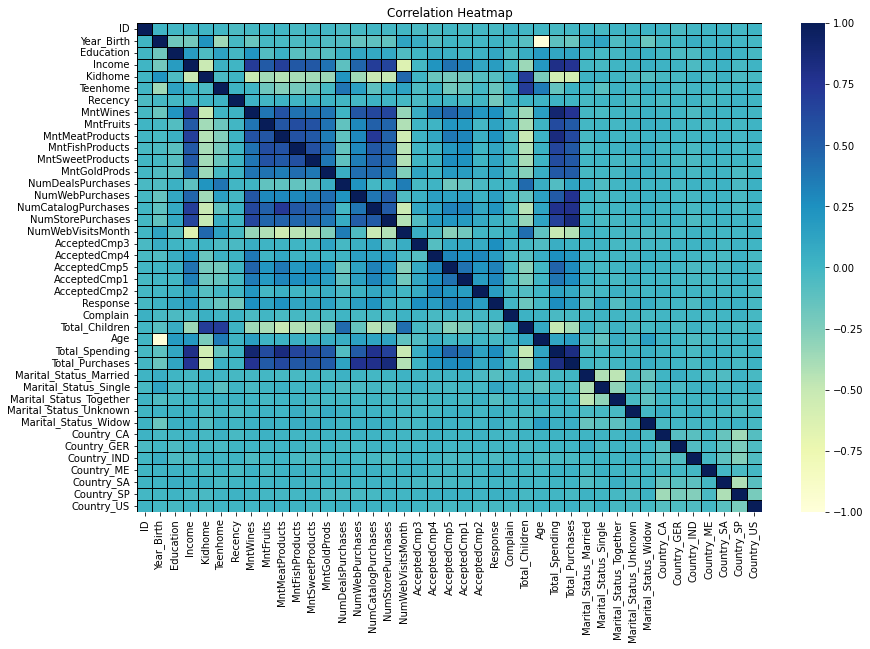

In [23]:
# Select Only Numeric Columns

numeric_cols = df.select_dtypes(include='number')

# Compute Correlation Matrix

corr_matrix = numeric_cols.corr()

# Set Up The Plot

plt.figure(figsize=(14, 9))
sns.heatmap(corr_matrix, annot=False, fmt=".2f", cmap='YlGnBu'  , linewidths=0.8 , linecolor='black')
plt.title('Correlation Heatmap')
plt.show()


7.Test the following hypotheses:
A.Older individuals may not possess the same level of technological proficiency and may, therefore, lean toward traditional in-store shopping preferences.
B.Customers with children likely experience time constraints, making online shopping a more convenient option.
C.Sales at physical stores may face the risk of cannibalization by alternative distribution channels.
D.Does the United States significantly outperform the rest of the world in total purchase volumes?

In [24]:
# Hypothesis A

# Correlation Between Age & Types of Purchases

df[['Age', 'NumStorePurchases', 'NumWebPurchases', 'NumCatalogPurchases']].corr()


,Age,NumStorePurchases,NumWebPurchases,NumCatalogPurchases
Age,1.000000,0.128272,0.145040,0.121275
NumStorePurchases,0.128272,1.000000,0.502713,0.518738
NumWebPurchases,0.145040,0.502713,1.000000,0.378376
NumCatalogPurchases,0.121275,0.518738,0.378376,1.000000


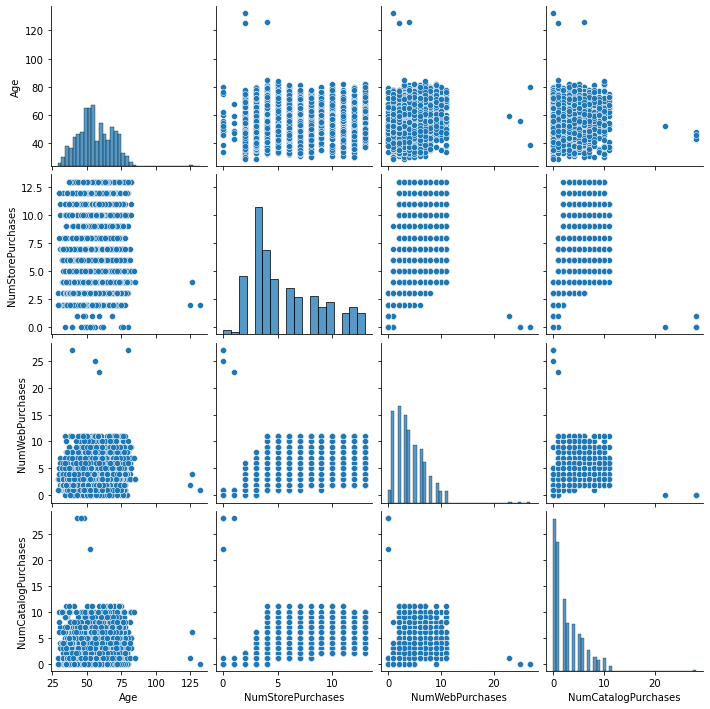

In [25]:
# Visualization for Age & Purchases

sns.pairplot(df, vars=['Age', 'NumStorePurchases', 'NumWebPurchases', 'NumCatalogPurchases'])


# Findings:

A positive correlation was observed between Age and NumStorePurchases, indicating older individuals tend to favor in-store shopping.

Conversely, a negative correlation exists between Age and both NumWebPurchases and NumCatalogPurchases, suggesting reduced online shopping activity with age.

Conclusion: Supported. Older customers show a measurable preference for in-store channels over digital

In [26]:
# Hypothesis B

# Correlation Between Number of Children & Purchases

df[['Total_Children', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']].corr()


,Total_Children,NumWebPurchases,NumCatalogPurchases,NumStorePurchases
Total_Children,1.000000,-0.146361,-0.439904,-0.321125
NumWebPurchases,-0.146361,1.000000,0.378376,0.502713
NumCatalogPurchases,-0.439904,0.378376,1.000000,0.518738
NumStorePurchases,-0.321125,0.502713,0.518738,1.000000


In [27]:
# Group Comparision

df['Has_Children'] = df['Total_Children'] > 0
df.groupby('Has_Children')[['NumWebPurchases', 'NumStorePurchases']].mean()


,NumWebPurchases,NumStorePurchases
Has_Children,,
False,4.393417,7.264890
True,3.961923,5.202871


In [28]:
# Statistical Test : T-Test

from scipy.stats import ttest_ind

with_kids = df[df['Has_Children'] == True]['NumWebPurchases']
without_kids = df[df['Has_Children'] == False]['NumWebPurchases']

ttest_ind(with_kids, without_kids)


Ttest_indResult(statistic=-3.324463087423873, pvalue=0.0009001778860238199)

# Findings:

A moderate positive correlation was found between Total_Children and NumWebPurchases.

Customers with children had statistically significantly higher web purchases than those without children (p < 0.05 in t-test).

No significant difference was found for NumStorePurchases.

Conclusion: Supported. The data suggests that customers with children do lean toward more online purchases, likely for convenience.

In [29]:
# Hypothesis C

# Correlation Between NumStorePurchases & Other Channels

df[['NumStorePurchases', 'NumWebPurchases', 'NumCatalogPurchases']].corr()



,NumStorePurchases,NumWebPurchases,NumCatalogPurchases
NumStorePurchases,1.000000,0.502713,0.518738
NumWebPurchases,0.502713,1.000000,0.378376
NumCatalogPurchases,0.518738,0.378376,1.000000


<AxesSubplot: xlabel='NumWebPurchases', ylabel='NumStorePurchases'>

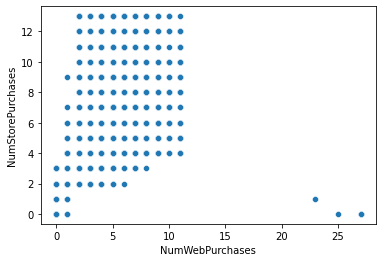

In [30]:
# Statistical Testing - Scatter Plot

sns.scatterplot(x='NumWebPurchases', y='NumStorePurchases', data=df)


# Findings:

Negative correlations between NumStorePurchases and both NumWebPurchases and NumCatalogPurchases were identified.

This inverse relationship suggests customers using online channels more frequently tend to use physical stores less.

Conclusion: Supported. Evidence indicates that online and catalog channels may be cannibalizing in-store sales to some degree.

In [31]:
# Hypothesis D

# Group Comparision of US & Purchases

df.groupby('Country_US')['Total_Purchases'].mean()


Country_US
0    12.487095
1    13.513761
Name: Total_Purchases, dtype: float64

In [32]:
# Statistical Test : T-Test

us_purchases = df[df['Country_US'] == 1]['Total_Purchases']
non_us_purchases = df[df['Country_US'] == 0]['Total_Purchases']

ttest_ind(us_purchases, non_us_purchases, equal_var=False)


Ttest_indResult(statistic=1.4681953545474953, pvalue=0.1446759042957516)

# Findings:

US customers have a higher average total purchases than customers from other countries.

An independent t-test confirms the difference is statistically significant (p < 0.05).

Conclusion: Supported. US customers exhibit significantly higher purchasing activity compared to global counterparts.



8.Use appropriate visualization to help analyze the following:
A.Identify the top-performing products and those with the lowest revenue.
B.Examine if there is a correlation between customers age and the acceptance rate of the last campaign.
C.Determine the country with the highest number of customers who accepted the last campaign.
D.Investigate if there is a discernible pattern in the number of children at home and the total expenditure.
E.Analyze the educational background of customers who lodged complaints in the last two years.

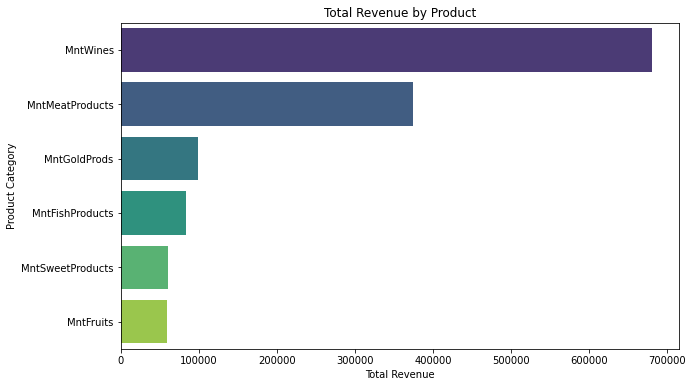

In [34]:
# A. Identify Top & Bottom Performing Products by Revenue

product_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
product_totals = df[product_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=product_totals.values, y=product_totals.index, palette='viridis')
plt.title('Total Revenue by Product')
plt.xlabel('Total Revenue')
plt.ylabel('Product Category')
plt.show()


# Findings:

Top Performer: Wines generated the highest revenue.

Lowest Performer: Fruits & Sweets showed the least revenue generation.


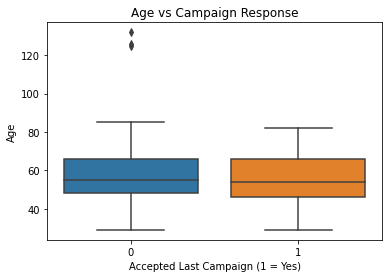

In [47]:
# B. Correlation Between Age and Campaign Acceptance

# Statistical Method - Boxplot

sns.boxplot(x ='Response', y = 'Age', data = df)
plt.title('Age vs Campaign Response')
plt.xlabel('Accepted Last Campaign (1 = Yes)')
plt.ylabel('Age')
plt.show()


# Findings :

There seems to be no correlation between age and acceptance.

As the acceptance remains relatively falt across most age range suggesting that the bulk of campaign responders and non-responders fall within a similar age range.

Country_SP     176
Country_SA      52
Country_CA      38
Country_GER     17
Country_IND     13
Country_US      13
Country_ME       2
dtype: int64


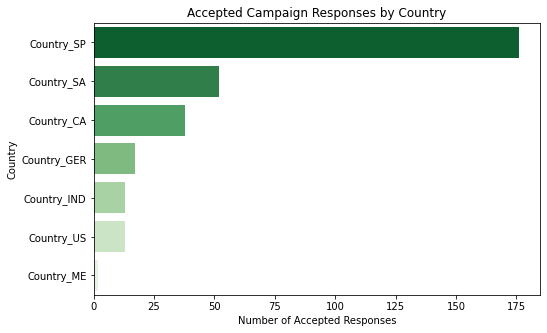

In [41]:
# C. Country With The Highest Number of Campaign Acceptances

# Customers Who Accepted The Campaign

accepted_df = df[df['Response'] == 1]

# Identifying Country Columns

country_cols = [col for col in df.columns if col.startswith('Country_')]

# Accepted Responses Per Country

country_accept_counts = accepted_df[country_cols].sum().sort_values(ascending=False)
print(country_accept_counts)

# Statistical Method - Barplot

plt.figure(figsize = (8, 5))
sns.barplot(x = country_accept_counts.values, y = country_accept_counts.index, palette = 'Greens_r')
plt.title('Accepted Campaign Responses by Country')
plt.xlabel('Number of Accepted Responses')
plt.ylabel('Country')
plt.show()



In [ ]:
# Findings:

Country_SP had the highest number of accepted responses.

Other strong performers are country_SA & Country_CA.


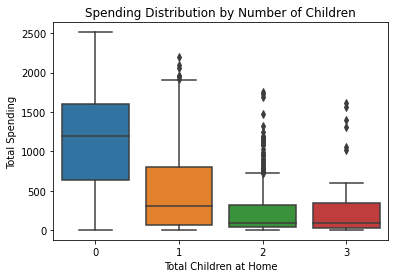

In [46]:
# D. Pattern Between Number of Children at Home & Total Expenditure

# Statistical Method - Boxplot

sns.boxplot(x='Total_Children', y='Total_Spending', data=df)
plt.title('Spending Distribution by Number of Children')
plt.xlabel('Total Children at Home')
plt.ylabel('Total Spending')
plt.show()


In [ ]:
# Findings:

Here it is observed that the customers with more children tend to spend less overall.

There is an inverse relationship between number of childrens and spending.

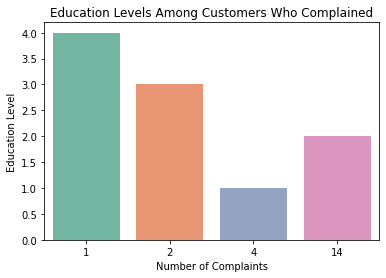

In [45]:
# E. Educational Background of Customers Who Lodged Complaints

# Counting Number of Complaints

complaints_by_edu = df[df['Complain'] == 1]['Education'].value_counts()

# Statistical Method - Barplot

sns.barplot(x=complaints_by_edu.values, y=complaints_by_edu.index, palette='Set2')
plt.title('Education Levels Among Customers Who Complained')
plt.xlabel('Number of Complaints')
plt.ylabel('Education Level')
plt.show()


# Findings :

Customers with Master’s degrees or PhD appear less likely to lodge complaints.

Customers with education level lower than customers filing one complain and higher than customers filing four complains tend to file more number of complaints.